<div align="center">
    <h1>NYC Trip Duration Predictive Model</h1>
</div>

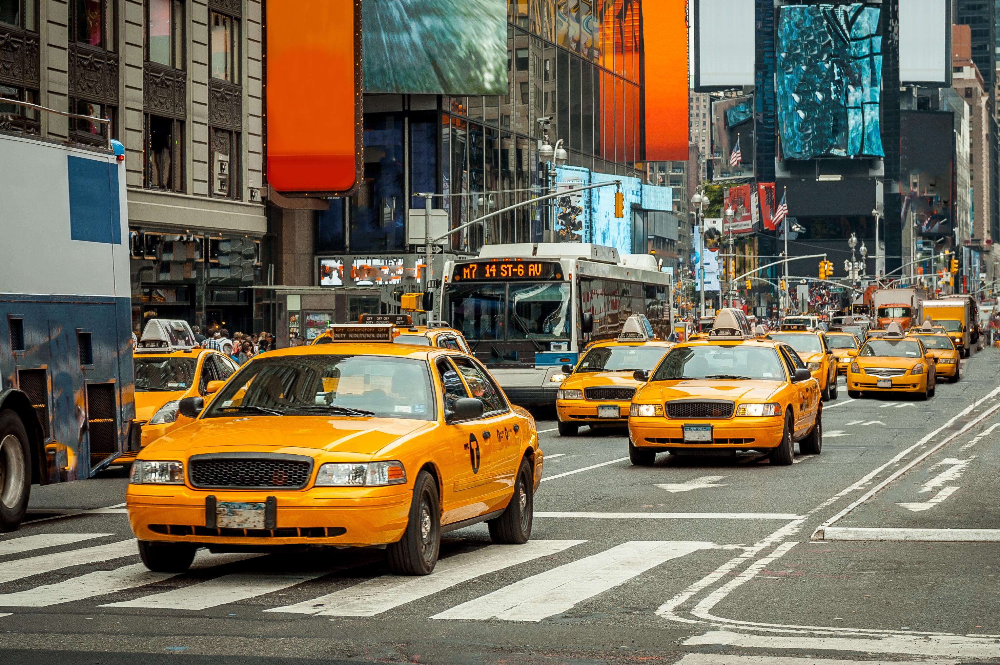

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib.inline
from geopy.distance import geodesic as GD
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
import xgboost as xgb

C:\Users\user\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\user\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
data = pd.read_pickle('NYC_trip_duration_prediction.pickle')

In [3]:
data

,id,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,pickup_dow,pickup_moy,...,dropoff_dow,dropoff_moy,dropoff_hour,pickup_time_of_day,dropoff_time_of_day,distance,speed,trip_duration,log_trip_duration,log_hav_distance
0,id1080784,2,1,-73.953918,40.778873,-73.963875,40.771164,N,Monday,2,...,Monday,2,16,Evening,Evening,1.199770,10.797929,6.666667,2.036882,0.788353
1,id0889885,1,2,-73.988312,40.731743,-73.994751,40.694931,N,Friday,3,...,Friday,3,23,Late night,Late night,4.123945,13.496548,18.333333,2.961831,1.633925
2,id0857912,2,2,-73.997314,40.721458,-73.948029,40.774918,N,Sunday,2,...,Sunday,2,18,Evening,Evening,7.250436,15.964262,27.250000,3.341093,2.110266
3,id3744273,2,6,-73.961670,40.759720,-73.956779,40.780628,N,Tuesday,1,...,Tuesday,1,10,Morning,Morning,2.358287,7.440694,19.016667,2.996565,1.211431
4,id0232939,1,1,-74.017120,40.708469,-73.988182,40.740631,N,Wednesday,2,...,Wednesday,2,6,Morning,Morning,4.328155,18.374244,14.133333,2.716900,1.673005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
729317,id3905982,2,2,-73.965919,40.789780,-73.952637,40.789181,N,Saturday,5,...,Saturday,5,13,Afternoon,Afternoon,1.123068,13.658936,4.933333,1.780586,0.752862
729318,id0102861,1,1,-73.996666,40.737434,-74.001320,40.731911,N,Monday,2,...,Monday,2,0,Late night,Late night,0.728563,8.326440,5.250000,1.832581,0.547291
729319,id0439699,1,1,-73.997849,40.761696,-74.001488,40.741207,N,Friday,4,...,Friday,4,19,Evening,Evening,2.295919,12.281291,11.216667,2.502801,1.192685
729320,id2078912,1,1,-74.006706,40.708244,-74.013550,40.713814,N,Sunday,6,...,Sunday,6,9,Morning,Morning,0.846722,6.819237,7.450000,2.134166,0.613412


In [4]:
data.drop(['log_hav_distance'],axis=1,inplace=True)

In [5]:
data.columns

Index(['id', 'vendor_id', 'passenger_count', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'store_and_fwd_flag', 'pickup_dow', 'pickup_moy', 'pickup_hour',
       'dropoff_dow', 'dropoff_moy', 'dropoff_hour', 'pickup_time_of_day',
       'dropoff_time_of_day', 'distance', 'speed', 'trip_duration',
       'log_trip_duration'],
      dtype='object')

In [6]:
data.dtypes

id                     category
vendor_id              category
passenger_count           int64
pickup_longitude        float64
pickup_latitude         float64
dropoff_longitude       float64
dropoff_latitude        float64
store_and_fwd_flag     category
pickup_dow             category
pickup_moy                int32
pickup_hour               int32
dropoff_dow            category
dropoff_moy               int32
dropoff_hour              int32
pickup_time_of_day     category
dropoff_time_of_day    category
distance                float64
speed                   float64
trip_duration           float64
log_trip_duration       float64
dtype: object

### Feature Engineering

In [7]:
data.head()

,id,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,pickup_dow,pickup_moy,pickup_hour,dropoff_dow,dropoff_moy,dropoff_hour,pickup_time_of_day,dropoff_time_of_day,distance,speed,trip_duration,log_trip_duration
0,id1080784,2,1,-73.953918,40.778873,-73.963875,40.771164,N,Monday,2,16,Monday,2,16,Evening,Evening,1.199770,10.797929,6.666667,2.036882
1,id0889885,1,2,-73.988312,40.731743,-73.994751,40.694931,N,Friday,3,23,Friday,3,23,Late night,Late night,4.123945,13.496548,18.333333,2.961831
2,id0857912,2,2,-73.997314,40.721458,-73.948029,40.774918,N,Sunday,2,17,Sunday,2,18,Evening,Evening,7.250436,15.964262,27.250000,3.341093
3,id3744273,2,6,-73.961670,40.759720,-73.956779,40.780628,N,Tuesday,1,9,Tuesday,1,10,Morning,Morning,2.358287,7.440694,19.016667,2.996565
4,id0232939,1,1,-74.017120,40.708469,-73.988182,40.740631,N,Wednesday,2,6,Wednesday,2,6,Morning,Morning,4.328155,18.374244,14.133333,2.716900


* Binning
* Transformations
* Feature Extraction
* One hot encoding

In [8]:
conti = data.select_dtypes(include=['float64','int64','int32'])
conti.columns

Index(['passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'pickup_moy', 'pickup_hour',
       'dropoff_moy', 'dropoff_hour', 'distance', 'speed', 'trip_duration',
       'log_trip_duration'],
      dtype='object')

In [9]:
def Uni_Conti(data, var):
    size = len(var)
    plt.figure(figsize=(18, 16))  # Adjusted figsize

    for j, i in enumerate(var):
        maxi = round(data[i].max(), 2)
        mini = round(data[i].min(), 2)
        rani = round(maxi - mini, 2)
        meani = round(data[i].mean(), 2)
        mediani = round(data[i].median(), 2)
        std_dev = round(data[i].std(), 2)
        skewi = round(data[i].skew(), 2)
        kurt = round(data[i].kurtosis(), 2)

        points = round(meani - std_dev, 2), round(meani + std_dev, 2)

        plt.subplot(4, 4, j + 1)
        sns.kdeplot(x=data[i], fill=True)
        sns.lineplot(x=points, y=[0, 0], color='black', label="within 1 std_dev")
        sns.scatterplot(x=[mini, maxi], y=[0, 0], color='orange', label=f"min&max={mini}&{maxi}")
        sns.scatterplot(x=[meani], y=[0], color='red', label=f"mean={meani}")
        sns.scatterplot(x=[mediani], y=[0], color='blue', label=f"median={mediani}")
        plt.xlabel(f'{i}', fontsize=16)  # Adjusted fontsize
        plt.ylabel('density')
        plt.title(f'within 1 std_dev={points[0]} to {points[1]}; kurtosis={kurt};\n skew = {skewi}; range = {rani}')

    plt.tight_layout()  # Adjust layout to prevent crowding
    plt.show()


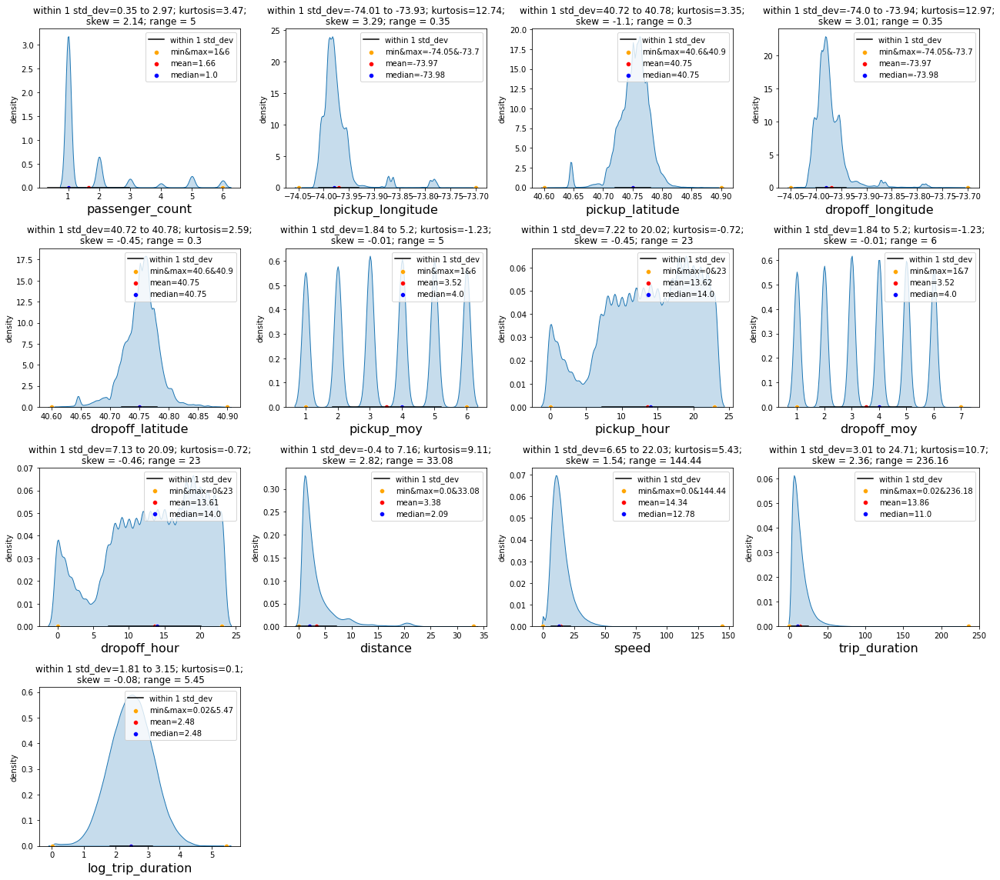

In [10]:
Uni_Conti(data, conti.columns)

In [11]:
data.drop(['trip_duration'],axis=1,inplace=True)

In [12]:
data.columns

Index(['id', 'vendor_id', 'passenger_count', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'store_and_fwd_flag', 'pickup_dow', 'pickup_moy', 'pickup_hour',
       'dropoff_dow', 'dropoff_moy', 'dropoff_hour', 'pickup_time_of_day',
       'dropoff_time_of_day', 'distance', 'speed', 'log_trip_duration'],
      dtype='object')

In [13]:
data.drop(['id'],axis=1,inplace=True)

IndexError: list index out of range

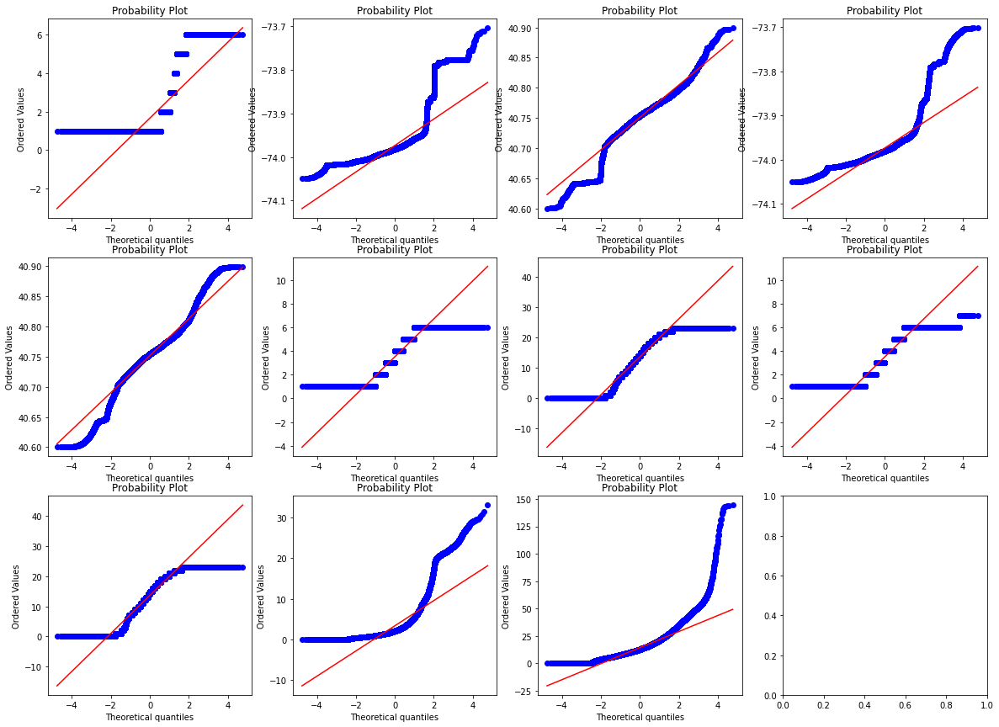

In [15]:
l=['passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'pickup_moy', 'pickup_hour',
       'dropoff_moy', 'dropoff_hour', 'distance', 'speed']
plt.figure(figsize=(20,20))
for i in range(1,16):
    plt.subplot(4,4,i)
    stats.probplot(data[l[i-1]],dist='norm',plot=plt)

* Feature Transformation

In [16]:
data.head()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,pickup_dow,pickup_moy,pickup_hour,dropoff_dow,dropoff_moy,dropoff_hour,pickup_time_of_day,dropoff_time_of_day,distance,speed,log_trip_duration
0,2,1,-73.953918,40.778873,-73.963875,40.771164,N,Monday,2,16,Monday,2,16,Evening,Evening,1.199770,10.797929,2.036882
1,1,2,-73.988312,40.731743,-73.994751,40.694931,N,Friday,3,23,Friday,3,23,Late night,Late night,4.123945,13.496548,2.961831
2,2,2,-73.997314,40.721458,-73.948029,40.774918,N,Sunday,2,17,Sunday,2,18,Evening,Evening,7.250436,15.964262,3.341093
3,2,6,-73.961670,40.759720,-73.956779,40.780628,N,Tuesday,1,9,Tuesday,1,10,Morning,Morning,2.358287,7.440694,2.996565
4,1,1,-74.017120,40.708469,-73.988182,40.740631,N,Wednesday,2,6,Wednesday,2,6,Morning,Morning,4.328155,18.374244,2.716900


In [17]:
data.dtypes

vendor_id              category
passenger_count           int64
pickup_longitude        float64
pickup_latitude         float64
dropoff_longitude       float64
dropoff_latitude        float64
store_and_fwd_flag     category
pickup_dow             category
pickup_moy                int32
pickup_hour               int32
dropoff_dow            category
dropoff_moy               int32
dropoff_hour              int32
pickup_time_of_day     category
dropoff_time_of_day    category
distance                float64
speed                   float64
log_trip_duration       float64
dtype: object

In [18]:
df = pd.get_dummies(data=data, columns=['pickup_dow','pickup_time_of_day'], drop_first=True,dtype=int)

In [19]:
df.drop(['store_and_fwd_flag','dropoff_dow','dropoff_time_of_day'],inplace=True,axis=1)

In [20]:
df['vendor_id'] = df['vendor_id'].astype('int64')

In [21]:
df.columns

Index(['vendor_id', 'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'pickup_moy', 'pickup_hour',
       'dropoff_moy', 'dropoff_hour', 'distance', 'speed', 'log_trip_duration',
       'pickup_dow_Monday', 'pickup_dow_Saturday', 'pickup_dow_Sunday',
       'pickup_dow_Thursday', 'pickup_dow_Tuesday', 'pickup_dow_Wednesday',
       'pickup_time_of_day_Evening', 'pickup_time_of_day_Late night',
       'pickup_time_of_day_Morning'],
      dtype='object')

In [ ]:
l=['vendor_id', 'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'pickup_moy', 'pickup_hour',
       'dropoff_moy', 'dropoff_hour', 'distance', 'speed', 'log_trip_duration',
       'pickup_dow_Monday', 'pickup_dow_Saturday', 'pickup_dow_Sunday',
       'pickup_dow_Thursday', 'pickup_dow_Tuesday', 'pickup_dow_Wednesday',
       'pickup_time_of_day_Evening', 'pickup_time_of_day_Late night',
       'pickup_time_of_day_Morning']
plt.figure(figsize=(20,20))
for i in range(1,16):
    plt.subplot(4,4,i)
    stats.probplot(df[l[i-1]],dist='norm',plot=plt)

In [22]:
df['pickup_latitude_round3'] = np.round(df['pickup_latitude'],3)
df['pickup_longitude_round3'] = np.round(df['pickup_longitude'],3)

df['dropoff_latitude_round3'] = np.round(df['dropoff_latitude'],3)
df['dropoff_longitude_round3'] = np.round(df['dropoff_longitude'],3)

In [23]:
df.drop(['pickup_longitude', 'pickup_latitude','dropoff_longitude', 'dropoff_latitude','dropoff_moy'],axis=1,inplace=True)

In [24]:
df.head()

,vendor_id,passenger_count,pickup_moy,pickup_hour,dropoff_hour,distance,speed,log_trip_duration,pickup_dow_Monday,pickup_dow_Saturday,...,pickup_dow_Thursday,pickup_dow_Tuesday,pickup_dow_Wednesday,pickup_time_of_day_Evening,pickup_time_of_day_Late night,pickup_time_of_day_Morning,pickup_latitude_round3,pickup_longitude_round3,dropoff_latitude_round3,dropoff_longitude_round3
0,2,1,2,16,16,1.199770,10.797929,2.036882,1,0,...,0,0,0,1,0,0,40.779,-73.954,40.771,-73.964
1,1,2,3,23,23,4.123945,13.496548,2.961831,0,0,...,0,0,0,0,1,0,40.732,-73.988,40.695,-73.995
2,2,2,2,17,18,7.250436,15.964262,3.341093,0,0,...,0,0,0,1,0,0,40.721,-73.997,40.775,-73.948
3,2,6,1,9,10,2.358287,7.440694,2.996565,0,0,...,0,1,0,0,0,1,40.760,-73.962,40.781,-73.957
4,1,1,2,6,6,4.328155,18.374244,2.716900,0,0,...,0,0,1,0,0,1,40.708,-74.017,40.741,-73.988


In [25]:
X = df.drop('log_trip_duration',axis=1)
y = df['log_trip_duration']

In [27]:
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=101,test_size=0.3)

In [29]:
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.transform(X_test)

In [30]:
# Calculating VIF for every column (only works for the not Catagorical)
VIF = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index =X.columns)
VIF

vendor_id                        1.141411e+01
passenger_count                  2.842433e+00
pickup_moy                       5.404239e+00
pickup_hour                      4.597711e+01
dropoff_hour                     4.636271e+01
distance                         2.676859e+00
speed                            7.299596e+00
pickup_dow_Monday                1.854530e+00
pickup_dow_Saturday              2.004343e+00
pickup_dow_Sunday                1.914987e+00
pickup_dow_Thursday              1.982465e+00
pickup_dow_Tuesday               1.913291e+00
pickup_dow_Wednesday             1.946571e+00
pickup_time_of_day_Evening       3.110249e+00
pickup_time_of_day_Late night    2.416423e+00
pickup_time_of_day_Morning       2.509735e+00
pickup_latitude_round3           2.611315e+06
pickup_longitude_round3          3.744216e+06
dropoff_latitude_round3          1.931444e+06
dropoff_longitude_round3         3.406322e+06
dtype: float64

### Model Building

In [32]:
def model_pred(model, X_train, y_train, X_test, y_test, cv=5):
    
    # Train the model on the training set
    model.fit(X_train, y_train)

    # Make predictions on the training and testing sets
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)

    # Calculate performance metrics on the training and testing sets
    mse_train = mean_squared_error(train_pred, y_train)
    mse_test = mean_squared_error(test_pred, y_test)
    test_r2 = r2_score(y_test, test_pred)

    # Perform cross-validation and calculate mean and std of MAE
    cv_mse_scores = cross_val_score(model, X_train, y_train, cv=cv)
    cv_accuracy = cv_mse_scores.mean()
    cv_std = cv_mse_scores.std()

    # Create a dictionary with the calculated metrics and titles
    results_dict = {
        'Model': str(model),
        'Train MSE': round(mse_train,3),
        'Test MSE': round(mse_test,3),
        'Testing R2': round(test_r2,3),
        'CV Accuracy': round(cv_accuracy,3),
        'CV Std': round(cv_std,3)
    }

   
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=test_pred)
    plt.title('Actual vs Predicted Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.grid(True)
    plt.show()
    return results_dict

### 1. Linear Regression

In [35]:
lr = LinearRegression()

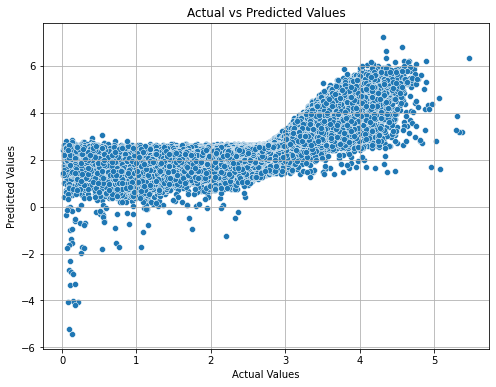

{'Model': 'LinearRegression()',
 'Train MSE': 0.136,
 'Test MSE': 0.136,
 'Testing R2': 0.696,
 'CV Accuracy': 0.696,
 'CV Std': 0.002}

In [36]:
model_pred(lr, X_train, y_train, X_test, y_test, cv=5)

### 2. Lasso 

In [38]:
ls = Lasso()

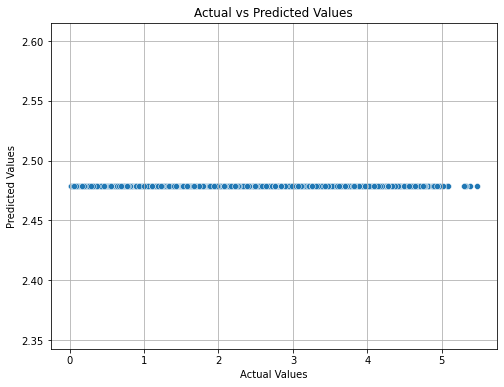

{'Model': 'Lasso()',
 'Train MSE': 0.447,
 'Test MSE': 0.446,
 'Testing R2': -0.0,
 'CV Accuracy': -0.0,
 'CV Std': 0.0}

In [39]:
model_pred(ls, X_train, y_train, X_test, y_test, cv=5)

### 3. Ridge 

In [41]:
rd = Ridge()

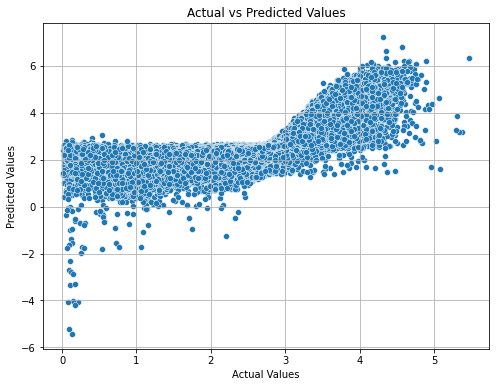

{'Model': 'Ridge()',
 'Train MSE': 0.136,
 'Test MSE': 0.136,
 'Testing R2': 0.696,
 'CV Accuracy': 0.696,
 'CV Std': 0.002}

In [42]:
model_pred(rd, X_train, y_train, X_test, y_test, cv=5)

### 4. Decision Tree 

In [ ]:
dt = DecisionTreeRegressor()

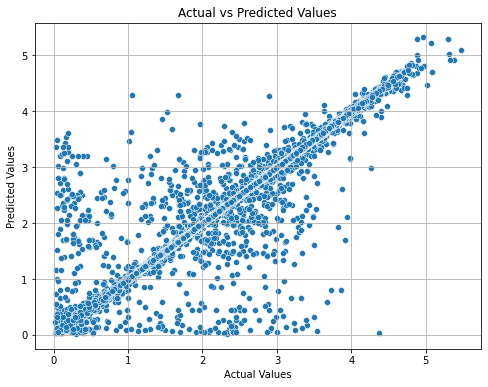

{'Model': 'DecisionTreeRegressor()',
 'Train MSE': 0.0,
 'Test MSE': 0.006,
 'Testing R2': 0.986,
 'CV Accuracy': 0.986,
 'CV Std': 0.001}

In [44]:
model_pred(dt, X_train, y_train, X_test, y_test, cv=5)

In [54]:
pred_y = dt.predict(X_test)
DF = pd.DataFrame({'Predicted':pred_y,'y_test':y_test})

In [57]:
DF['Predicted'] = np.exp(DF['Predicted'])
DF['y_test'] = np.exp(DF['y_test'])

In [58]:
DF

,Predicted,y_test
483129,3.000000,3.016667
355604,6.583333,6.583333
504229,15.416667,15.400000
57923,22.300000,22.350000
387069,11.750000,11.783333
...,...,...
604217,21.333333,21.400000
110089,30.983333,30.983333
484535,10.833333,10.816667
610257,14.000000,14.050000


### 5. Xg Boost

In [60]:
xg = XGBRegressor()

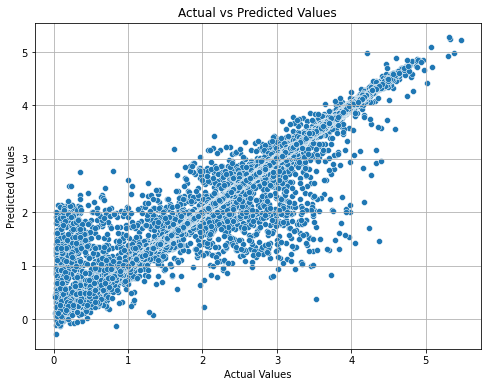

{'Model': 'XGBRegressor(base_score=None, booster=None, callbacks=None,\n             colsample_bylevel=None, colsample_bynode=None,\n             colsample_bytree=None, device=None, early_stopping_rounds=None,\n             enable_categorical=False, eval_metric=None, feature_types=None,\n             gamma=None, grow_policy=None, importance_type=None,\n             interaction_constraints=None, learning_rate=None, max_bin=None,\n             max_cat_threshold=None, max_cat_to_onehot=None,\n             max_delta_step=None, max_depth=None, max_leaves=None,\n             min_child_weight=None, missing=nan, monotone_constraints=None,\n             multi_strategy=None, n_estimators=None, n_jobs=None,\n             num_parallel_tree=None, random_state=None, ...)',
 'Train MSE': 0.005,
 'Test MSE': 0.007,
 'Testing R2': 0.984,
 'CV Accuracy': 0.984,
 'CV Std': 0.001}

In [61]:
model_pred(xg, X_train, y_train, X_test, y_test, cv=5)

In [62]:
pred_y = xg.predict(X_test)
DF = pd.DataFrame({'Predicted':pred_y,'y_test':y_test})

In [63]:
DF['Predicted'] = np.exp(DF['Predicted'])
DF['y_test'] = np.exp(DF['y_test'])

In [64]:
DF

,Predicted,y_test
483129,3.032955,3.016667
355604,6.644811,6.583333
504229,15.427771,15.400000
57923,22.263552,22.350000
387069,11.822458,11.783333
...,...,...
604217,21.309776,21.400000
110089,32.439098,30.983333
484535,10.877520,10.816667
610257,14.013332,14.050000


### Decision Tree model has worked with Test MSE of 0.06 and R2 score of 0.98. 